# Analyze PCP- vs. Saline-treated mouse frontal cortex snRNA-seq

Data from Ctr for Epigenomics.  

3 batches, each batch has 1 group of Saline treated mice and 1 group of PCP treated. Dissection focused on prelimbic cortex but included a generous margin, so we find parts of olfactory bulb and striatum as well.

Notes:
- Gapdh does not seem to be expressed? Is this an issue with the quantification? Seems like 10X data misses this gene...
  

In [1]:
from tqdm import tqdm
import scanpy as sc
import pandas as pd,numpy as np
import seaborn as sns
import matplotlib as mpl
import scrublet as scr
import matplotlib.pyplot as plt

sc.settings.verbosity=3

from datetime import datetime
today=datetime.today().strftime('%y%d%m')

# Load the cellbender outputs from all samples and combine into AnnData

In [8]:
samples=['JD_47_1_2','JD_48_1_2','JD_52_1_2','JD_53_1_2','JD_58_1_2','JD_59_1_2']
samplesheet=pd.read_csv('KIBM_Spitzer_NeurotransmitterSwitching/Spitzer-HT-RNA-Batch-2.csv',index_col='LibID')
samplesheet=pd.concat((samplesheet,pd.read_csv('KIBM_Spitzer_NeurotransmitterSwitching/Spitzer-HT-RNA-Batch-1.csv',index_col='LibID')))
samplesheet=pd.concat((samplesheet,pd.read_csv('KIBM_Spitzer_NeurotransmitterSwitching/Spitzer-HT-RNA-Batch-3.csv',index_col='LibID')))
samplesheet=samplesheet.sort_index()
samplesheet=samplesheet[~samplesheet.index.duplicated()]

In [11]:
%%time
adatas=[]
genes=pd.read_csv('/cndd/emukamel/KIBM_neuroswitch/KIBM_Spitzer_NeurotransmitterSwitching/counts/JD_52_1_2/outs/raw_feature_bc_matrix/features.tsv.gz',
                  sep='\t',index_col=0,names=['ensid','gene','genetype'])
for libid in tqdm(samples):
    libid_base = libid.replace('_1_2','')
    # ad=sc.read_10x_h5(f'KIBM_Spitzer_NeurotransmitterSwitching/counts/{libid}/outs/filtered_feature_bc_matrix.h5')
    ad=sc.read_10x_h5(f'KIBM_Spitzer_NeurotransmitterSwitching/cellbender/{libid_base}/{libid}_cellbender_filtered.h5')
    assert (ad.var_names==genes['gene']).all()
    ad.var=genes
    print(ad.shape)

    # Keep only cells with ≥100 counts
    # sc.pp.filter_cells(ad, min_counts=100)

    # ad.var_names_make_unique()
    ad.obs.index=ad.obs.index+'-'+libid
    ad.obs['LibID']=libid
    ad.obs['Sample']=samplesheet.loc[libid,'Sample']
    adatas.append(ad)


  0%|          | 0/6 [00:00<?, ?it/s]

reading KIBM_Spitzer_NeurotransmitterSwitching/cellbender/JD_47/JD_47_1_2_cellbender_filtered.h5
 (0:00:01)


/home/emukamel/mambaforge/envs/analysis/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
 17%|█▋        | 1/6 [00:02<00:12,  2.40s/it]

(22762, 31053)
reading KIBM_Spitzer_NeurotransmitterSwitching/cellbender/JD_48/JD_48_1_2_cellbender_filtered.h5
 (0:00:01)


/home/emukamel/mambaforge/envs/analysis/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
 33%|███▎      | 2/6 [00:04<00:09,  2.47s/it]

(26894, 31053)
reading KIBM_Spitzer_NeurotransmitterSwitching/cellbender/JD_52/JD_52_1_2_cellbender_filtered.h5
 (0:00:01)


/home/emukamel/mambaforge/envs/analysis/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
 50%|█████     | 3/6 [00:06<00:06,  2.18s/it]

(23661, 31053)
reading KIBM_Spitzer_NeurotransmitterSwitching/cellbender/JD_53/JD_53_1_2_cellbender_filtered.h5
 (0:00:01)


/home/emukamel/mambaforge/envs/analysis/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
 67%|██████▋   | 4/6 [00:08<00:04,  2.13s/it]

(19842, 31053)
reading KIBM_Spitzer_NeurotransmitterSwitching/cellbender/JD_58/JD_58_1_2_cellbender_filtered.h5
 (0:00:01)


/home/emukamel/mambaforge/envs/analysis/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
 83%|████████▎ | 5/6 [00:11<00:02,  2.30s/it]

(23684, 31053)
reading KIBM_Spitzer_NeurotransmitterSwitching/cellbender/JD_59/JD_59_1_2_cellbender_filtered.h5
 (0:00:02)


/home/emukamel/mambaforge/envs/analysis/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
100%|██████████| 6/6 [00:15<00:00,  2.52s/it]

(22459, 31053)
CPU times: user 11.2 s, sys: 3.46 s, total: 14.7 s
Wall time: 15.2 s


In [12]:
adata=sc.concat(adatas,axis=0)
adata.obs_names_make_unique()

In [13]:
adata.var=adata.var.join(genes)

In [15]:
adata.obs['Sample']=adata.obs['Sample'].astype(pd.CategoricalDtype(['Sal 1','Sal 2','Sal 3','PCP 1','PCP 2','PCP 3'],ordered=True))

In [16]:
sc.pp.filter_genes(adata, min_counts=100)
sc.pp.filter_cells(adata,min_genes=50)
sc.pp.filter_cells(adata, min_counts=500)

filtered out 11570 genes that are detected in less than 100 counts
filtered out 190 cells that have less than 50 genes expressed
filtered out 23401 cells that have less than 500 counts


In [21]:
adata.obs['Sample'].value_counts(sort=False)

Sample
Sal 1    22675
Sal 2    16472
Sal 3    18412
PCP 1    19803
PCP 2    17707
PCP 3    20642
Name: count, dtype: int64

In [22]:
sc.pp.filter_genes(adata,min_cells=10)

Text(0.5, 0, 'UMI counts')

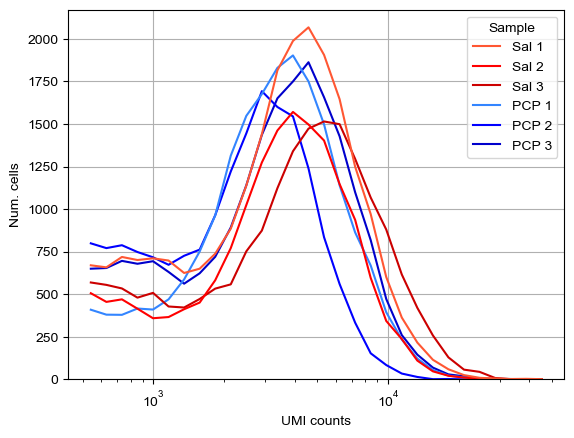

In [37]:
ax=sns.histplot(adata.obs,x='n_counts',hue='Sample',log_scale=True,fill=False,
                element='poly',bins=30,
                # stat='density',
                common_norm=False,
               palette=palette)
ax.grid(True)
ax.set_ylabel('Num. cells')
ax.set_xlabel('UMI counts')

In [38]:
# Save adata that can be used for MapMyCells
adata.write_h5ad('KIBM_adata_raw_cellbender.h5ad')

In [64]:
for batch in [1,2,3]:
    adata[adata.obs['Sample'].str.endswith(f'{batch}')].write_h5ad(f'KIBM_adata_raw_cellbender.batch{batch}.h5ad')
    print(adata[adata.obs['Sample'].str.endswith(f'{batch}')].shape)

(42478, 19483)
(34179, 19483)
(39054, 19483)


# Load raw data

In [41]:
adata_raw=sc.read_h5ad('KIBM_adata_raw_cellbender.h5ad')

In [42]:
adata_raw.var['gene']=adata_raw.var['gene'].astype(str)
adata_raw.var=adata_raw.var.set_index('gene')

In [51]:
adata_raw.X=adata_raw.X.astype(float)

In [52]:
sc.pp.normalize_per_cell(adata_raw,counts_per_cell_after=1e6)

normalizing by total count per cell


/home/emukamel/mambaforge/envs/analysis/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


    finished (0:00:05): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [53]:
# np.log(adata_raw[:,'Malat1'].X.median()+1)
adata_raw[adata.obs.index,'Malat1'].X.max()

379591.8367346939

# MapMyCells annotation

https://knowledge.brain-map.org/mapmycells/process/

In [2]:
# adata=sc.read_h5ad('KIBM_adata_raw.h5ad')
adata=sc.read_h5ad('KIBM_adata_raw_cellbender.h5ad')

In [4]:
from glob import glob
annots=glob('MapMyCells/KIBM_adata_raw_cellbenderbatch*.csv')
dfs=[]
for annot in annots:
    dfs.append(pd.read_csv(annot,comment='#'))
mapped=pd.concat(dfs)

In [14]:
# Filter out cells that had a low posterior probability of cluster assignment by MapMyCells
# mapped=pd.read_csv('MapMyCells/KIBM_adata_raw_10xWholeMouseBrain(CCN20230722)_HierarchicalMapping_UTC_1716327709995.csv',
#                   comment='#')
pthresh=0
for clusters in ['class','subclass','supertype','cluster']:
    mapped.loc[mapped[f'{clusters}_bootstrapping_probability']<pthresh,f'{clusters}_name']='-'

In [15]:
# mapped['subclass_bootstrapping_probability'].plot(kind='hist')
if 'class_name' in adata.obs.columns:
    adata.obs=adata.obs.drop(columns=['class_name','subclass_name','supertype_name','cluster_name'])
adata.obs=adata.obs.join(mapped[['cell_id','class_name','subclass_name','supertype_name','cluster_name']].set_index('cell_id'))

In [16]:
def min_obs(names,thresh=20):
    # Weed out labels with too few observations
    counts=names.value_counts()
    badnames=counts[counts<thresh]
    badcells=names.isin(badnames.index)
    print(f'{names.name}: Removing {len(badnames)}/{counts.shape[0]} categories, {badcells.sum()}/{badcells.shape[0]} cells')
    names[badcells]='-'
    return names

for clusters in ['class_name','subclass_name','supertype_name','cluster_name']:
    adata.obs[clusters]=min_obs(adata.obs[clusters].copy())

class_name: Removing 7/33 categories, 42/115711 cells
subclass_name: Removing 166/235 categories, 727/115711 cells
supertype_name: Removing 408/589 categories, 1420/115711 cells
cluster_name: Removing 894/1283 categories, 3349/115711 cells


In [17]:
for category in ['class','subclass','supertype','cluster']:
    adata.obs[f'{category}_label']=adata.obs[f'{category}_name'].str.replace(r'^[0-9]+ ','',regex=True)

In [18]:
my_obs=adata.obs.copy()

In [19]:
# Remove glia and unlabeled cells
adata.obs['is_ctx_neuron']=(adata.obs['class_label'].str.contains(r'(Glut|GABA)$',regex=True))
adata.obs['is_ctx_neuron']=adata.obs['is_ctx_neuron']&(~adata.obs['subclass_label'].str.contains(r'STR',regex=True).astype(bool))
adata.obs['is_ctx_neuron'].value_counts()

/scratch/ipykernel_2751708/2360747948.py:2: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  adata.obs['is_ctx_neuron']=(adata.obs['class_label'].str.contains(r'(Glut|GABA)$',regex=True))


is_ctx_neuron
True     93523
False    22188
Name: count, dtype: int64

In [82]:
adata.write_h5ad(f'KIBM_adata_mapmycells.h5ad')

In [ ]:
# Subset to just neurons
adata=adata[adata.obs['is_ctx_neuron']].copy()

In [ ]:
adata.write_h5ad('KIBM_adata_clustered_CtxNeurons_242705.h5ad')

In [83]:
adata.obs['class_bootstrapping_probability'] = mapped.set_index('cell_id')['class_bootstrapping_probability']

In [ ]:
# Scanpy normalization, Leiden clustering

# Scanpy normalization, Leiden clustering

In [84]:
adata.var["mt"] = adata.var['gene'].str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True, log1p=True)

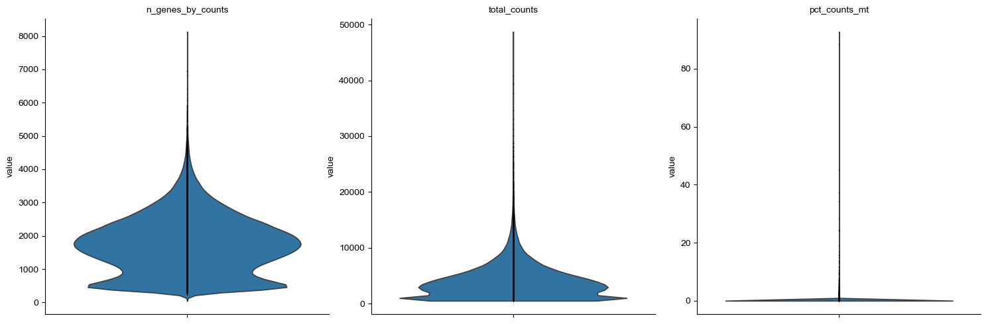

In [85]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=False,
    multi_panel=True,
)

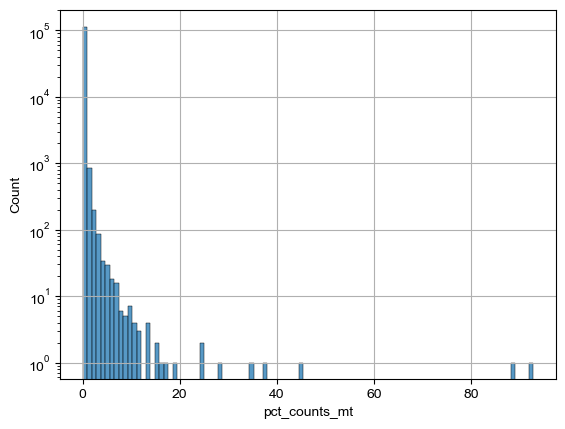

In [88]:
ax=sns.histplot(adata.obs,x='pct_counts_mt',bins=100)
ax.grid()
ax.set_yscale('log')

In [89]:
adata = adata[adata.obs['pct_counts_mt']<5].copy()
adata.shape

(115619, 19483)

### Run scrublet with scanpy

In [90]:
%%time 
sc.pp.scrublet(adata, batch_key="Sample")

Running Scrublet
filtered out 13 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:01)
Embedding transcriptomes using PCA...
    using data matrix X directly
Automatically set threshold at doublet score = 0.17
Detected doublet rate = 5.5%
Estimated detectable doublet fraction = 58.9%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 9.3%
filtered out 14 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var

In [91]:
adata.write_h5ad(f'KIBM_adata_scrublet_{today}.h5ad')

In [93]:
adata.obs['predicted_doublet'].value_counts()

predicted_doublet
False    109002
True       6617
Name: count, dtype: int64

## HVG, Leiden, etc.

In [118]:
adata.var.set_index('gene',drop=False,inplace=True)

In [95]:
adata.X=adata.X.astype(float)

In [96]:
# sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e6)
# Check normalization
adata.obs

,LibID,Sample,n_genes,n_counts,class_name,subclass_name,supertype_name,cluster_name,class_label,subclass_label,...,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,doublet_score,predicted_doublet
ATTCTACCAGCCTTCT-1-JD_47_1_2,JD_47_1_2,PCP 1,6427,33119,02 NP-CT-L6b Glut,030 L6 CT CTX Glut,0115 L6 CT CTX Glut_2,0441 L6 CT CTX Glut_2,NP-CT-L6b Glut,L6 CT CTX Glut,...,10.407893,24.807512,33.165253,42.609982,56.671397,38,3.663562,0.114738,0.577778,True
ACCGTTCTCTTCTGGC-1-JD_47_1_2,JD_47_1_2,PCP 1,5700,31430,01 IT-ET Glut,022 L5 ET CTX Glut,0090 L5 ET CTX Glut_1,0353 L5 ET CTX Glut_1,IT-ET Glut,L5 ET CTX Glut,...,10.355550,30.789055,39.338212,48.425072,62.198536,4,1.609438,0.012727,0.023821,False
CCTCACAGTCAGACTT-1-JD_47_1_2,JD_47_1_2,PCP 1,5317,27838,01 IT-ET Glut,022 L5 ET CTX Glut,0090 L5 ET CTX Glut_1,0352 L5 ET CTX Glut_1,IT-ET Glut,L5 ET CTX Glut,...,10.234193,30.785258,40.049573,49.446799,63.269631,1,0.693147,0.003592,0.256845,True
CCACACTGTTCCCACT-1-JD_47_1_2,JD_47_1_2,PCP 1,5547,27088,02 NP-CT-L6b Glut,030 L6 CT CTX Glut,0115 L6 CT CTX Glut_2,0441 L6 CT CTX Glut_2,NP-CT-L6b Glut,L6 CT CTX Glut,...,10.206883,29.171589,37.308033,46.459687,60.491731,8,2.197225,0.029533,0.347079,True
TACCTCGTCCCTATTA-1-JD_47_1_2,JD_47_1_2,PCP 1,5133,26574,01 IT-ET Glut,005 L5 IT CTX Glut,0018 L5 IT CTX Glut_1,0056 L5 IT CTX Glut_1,IT-ET Glut,L5 IT CTX Glut,...,10.187726,29.160081,38.221570,48.415745,62.982615,4,1.609438,0.015052,0.098901,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CTATAGGCAGGTTCAT-1-JD_59_1_2,JD_59_1_2,Sal 3,425,508,34 Immune,334 Microglia NN,1194 Microglia NN_1,5312 Microglia NN_1,Immune,Microglia NN,...,6.232448,24.015748,36.023622,55.708661,100.000000,5,1.791759,0.984252,0.001062,False
ACTTAGGCACCCTATC-1-JD_59_1_2,JD_59_1_2,Sal 3,323,504,31 OPC-Oligo,327 Oligo NN,1184 MOL NN_4,5285 MOL NN_4,OPC-Oligo,Oligo NN,...,6.224558,44.246032,55.753968,75.595238,100.000000,0,0.000000,0.000000,0.006694,False
GGTGGCTCAAGCTACT-1-JD_59_1_2,JD_59_1_2,Sal 3,409,502,34 Immune,334 Microglia NN,1194 Microglia NN_1,5312 Microglia NN_1,Immune,Microglia NN,...,6.220590,27.888446,38.446215,58.366534,100.000000,0,0.000000,0.000000,0.001062,False
TACGGTACACATCCCT-1-JD_59_1_2,JD_59_1_2,Sal 3,381,500,34 Immune,334 Microglia NN,1194 Microglia NN_1,5312 Microglia NN_1,Immune,Microglia NN,...,6.216606,32.800000,43.800000,63.800000,100.000000,0,0.000000,0.000000,0.000925,False


In [97]:
sc.pp.log1p(adata, base=10)

In [99]:
sc.pp.highly_variable_genes(adata, batch_key="Sample")
adata.var['highly_variable'].value_counts()

extracting highly variable genes
    finished (0:00:28)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


highly_variable
False    17424
True      2059
Name: count, dtype: int64

In [100]:
sc.tl.pca(adata, mask_var='highly_variable')

computing PCA
    with n_comps=50


/home/emukamel/mambaforge/envs/analysis/lib/python3.9/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


    finished (0:00:19)


In [101]:
%%time
sc.external.pp.harmony_integrate(adata,key='Sample')

2024-06-22 16:58:44,468 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-06-22 16:58:57,390 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-06-22 16:58:58,157 - harmonypy - INFO - Iteration 1 of 10
2024-06-22 16:59:55,860 - harmonypy - INFO - Iteration 2 of 10
2024-06-22 17:00:52,465 - harmonypy - INFO - Iteration 3 of 10
2024-06-22 17:01:47,609 - harmonypy - INFO - Iteration 4 of 10
2024-06-22 17:02:34,859 - harmonypy - INFO - Iteration 5 of 10
2024-06-22 17:03:30,054 - harmonypy - INFO - Iteration 6 of 10
2024-06-22 17:03:59,734 - harmonypy - INFO - Iteration 7 of 10
2024-06-22 17:04:20,057 - harmonypy - INFO - Converged after 7 iterations


CPU times: user 23min 15s, sys: 17min 35s, total: 40min 51s
Wall time: 5min 35s


In [102]:
sc.pp.neighbors(adata,
                use_rep='X_pca_harmony'
               )

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:21)


In [103]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:01)


In [104]:
sc.tl.leiden(adata,resolution=2,random_state=1)

running Leiden clustering


/scratch/ipykernel_2504240/1858155892.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata,resolution=2,random_state=1)


    finished: found 63 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:59)


In [ ]:
# Save the clustered results
adata.write_h5ad(f'KIBM_adata_cellbender_clustered_{today}.h5ad')

# Make some plots

In [22]:
adata=sc.read_h5ad('KIBM_adata_cellbender_clustered_242206.h5ad')

In [26]:
adata.obs.iloc[0]

LibID                                          JD_47_1_2
Sample                                             PCP 1
n_genes                                             6427
n_counts                                           33119
class_name                             02 NP-CT-L6b Glut
subclass_name                         030 L6 CT CTX Glut
supertype_name                     0115 L6 CT CTX Glut_2
cluster_name                       0441 L6 CT CTX Glut_2
class_label                               NP-CT-L6b Glut
subclass_label                            L6 CT CTX Glut
supertype_label                         L6 CT CTX Glut_2
cluster_label                           L6 CT CTX Glut_2
is_ctx_neuron                                       True
class_bootstrapping_probability                      1.0
n_genes_by_counts                                   6427
log1p_n_genes_by_counts                         8.768419
total_counts                                       33119
log1p_total_counts             

<Axes: xlabel='doublet_score', ylabel='Count'>

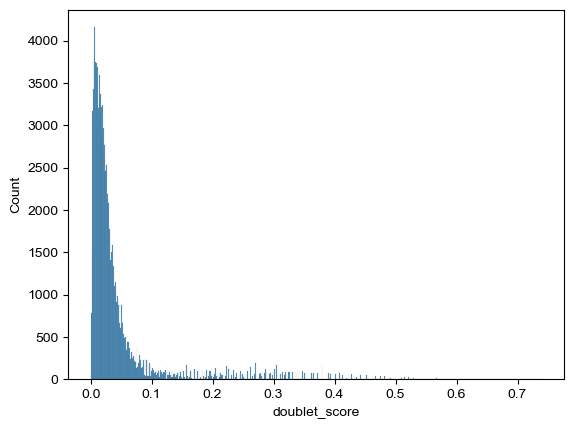

In [29]:
sns.histplot(adata.obs['doublet_score'])

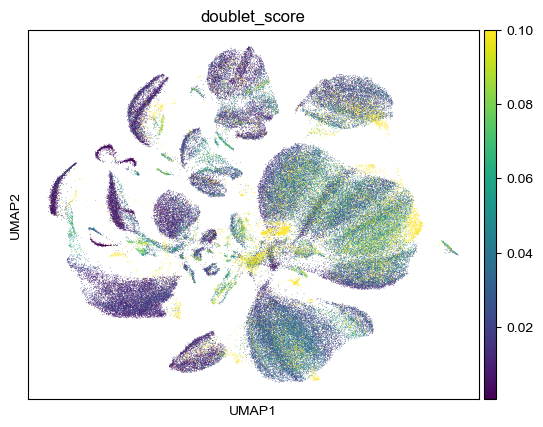

In [30]:
sc.pl.umap(adata, color='doublet_score',vmax=.1)

In [39]:
# sns.countplot(adata.obs['subclass_label'])
df_c = adata.obs.groupby(['subclass_label','Sample'])['LibID'].count().unstack().T

/scratch/ipykernel_2751708/4134646716.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_c = adata.obs.groupby(['subclass_label','Sample'])['LibID'].count().unstack().T


<Axes: xlabel='Sample'>

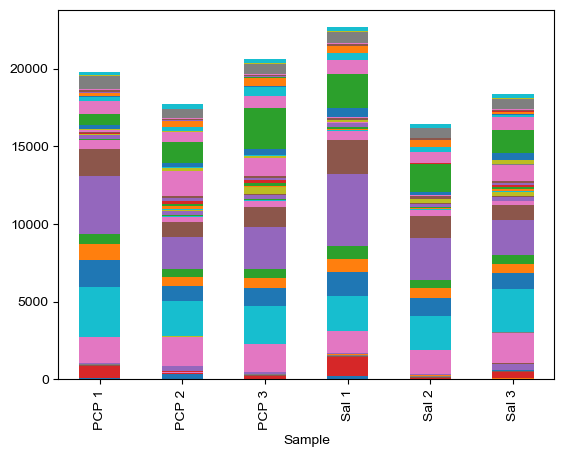

In [41]:
df_c.plot(kind='bar',stacked=True,legend=False)

In [133]:
plt.rcParams['figure.dpi'] = 300

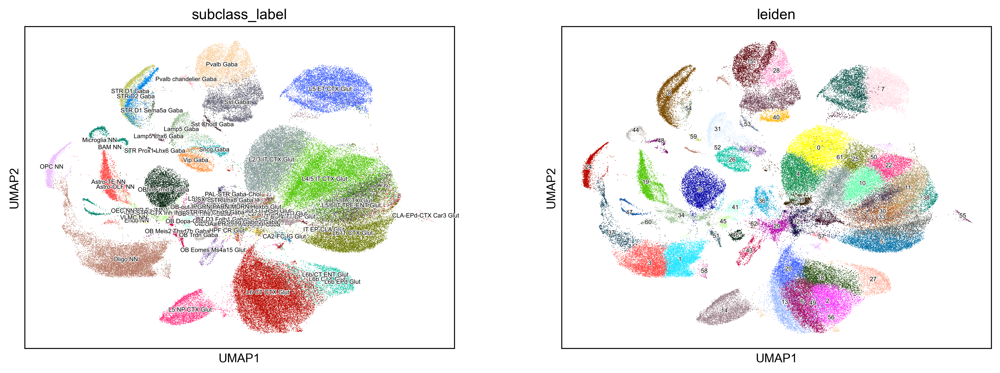

In [137]:
plt.rcParams['figure.dpi'] = 300
sc.pl.umap(adata,color=['subclass_label','leiden'],legend_loc='on data',
           legend_fontsize=5,legend_fontweight='normal',legend_fontoutline=1)

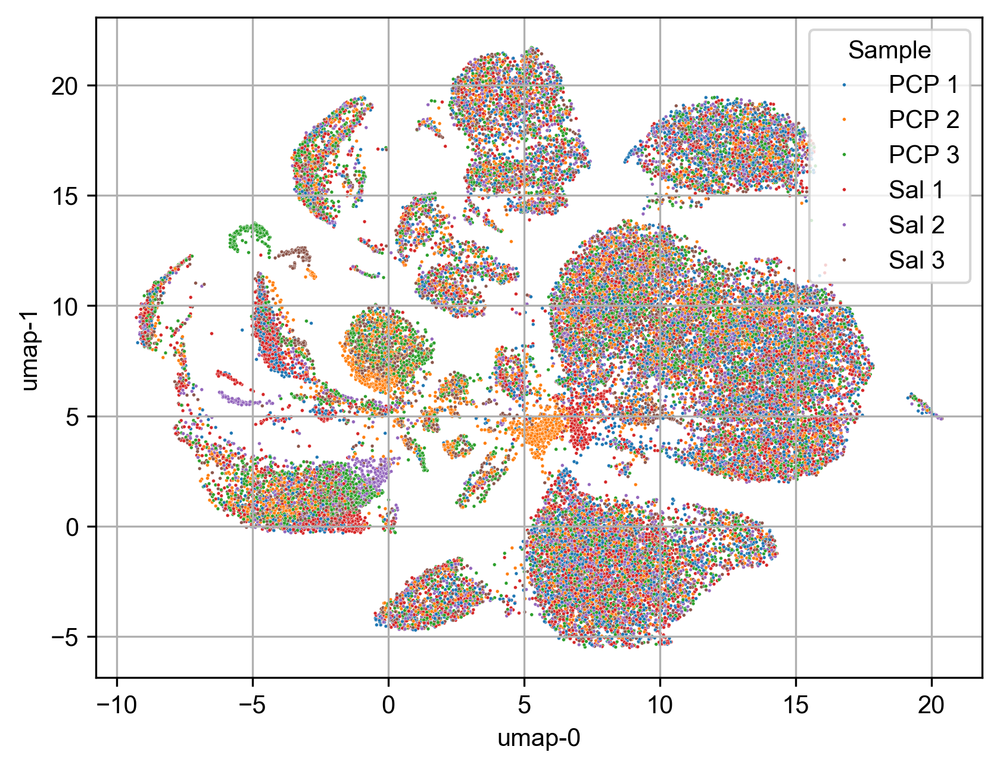

In [141]:
ax=sns.scatterplot(adata.obs.sample(40000),x='umap-0',y='umap-1',hue='Sample',s=2)
ax.grid(True)

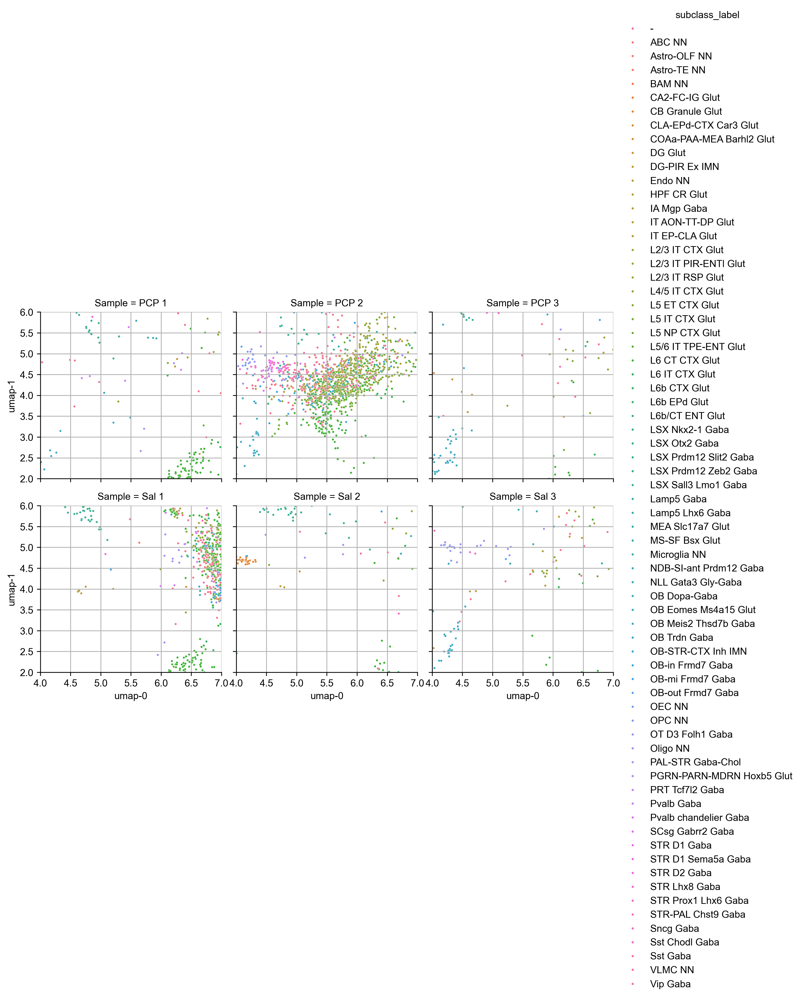

In [143]:
adata.obs['umap-0']=adata.obsm['X_umap'][:,0]
adata.obs['umap-1']=adata.obsm['X_umap'][:,1]

g=sns.relplot(adata.obs, kind='scatter',s=5,
            hue='subclass_label',
           x='umap-0',y='umap-1',col='Sample',col_wrap=3,
             height=3)
g.set(xlim=[4,7],ylim=[2,6])
for ax in g.axes.flatten():
    ax.grid(True)

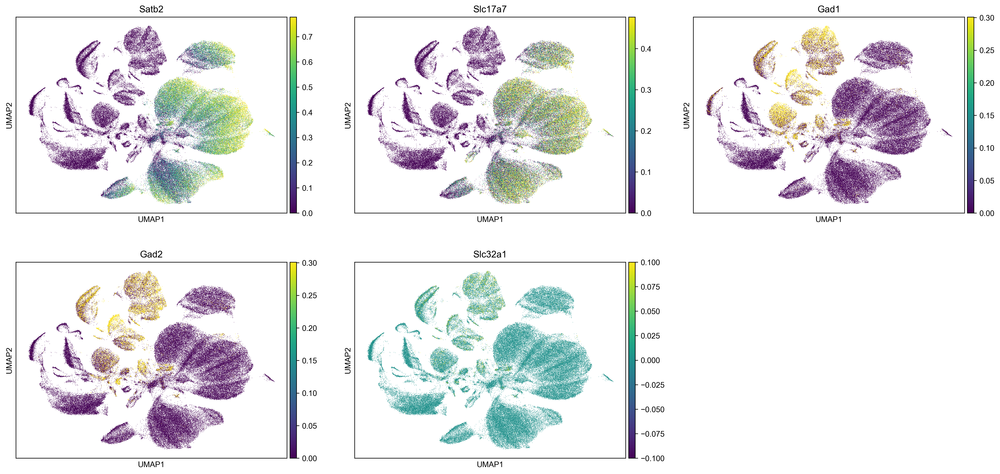

In [145]:
sc.pl.umap(adata,
           color=['Satb2','Slc17a7','Gad1','Gad2','Slc32a1'],
           legend_loc='on data',
           ncols=3,
          vmax='p95')

In [106]:
adata.write_h5ad(f'KIBM_adata_cellbender_clustered_{today}.h5ad')

In [ ]:
# adata=sc.read_h5ad('KIBM_adata_clustered_242105.h5ad')

In [ ]:
# adata.obs.shape, my_obs.shape
# my_obs=my_obs.filter(like='_name')
# adata.obs=adata.obs.drop(columns=my_obs.columns)
# adata.obs=adata.obs.join(my_obs,how='left')

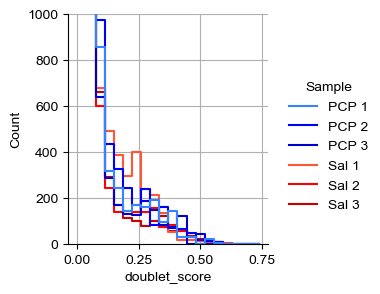

In [107]:
g=sns.displot(adata.obs,kind='hist',x='doublet_score',
              # hue='predicted_doublet',
              hue='Sample',
              height=3,
              # col_wrap=2,
            bins=20,element='step',fill=False,
              palette=palette
             )
for ax in g.axes.flatten():
    # ax.set_yscale('log')
    ax.set_ylim([0,1000])
    ax.grid()

In [ ]:
# Separate UMAP plots per sample
adata.obs['UMAP-0']=adata.obsm['X_umap'][:,0]
adata.obs['UMAP-1']=adata.obsm['X_umap'][:,1]
g=sns.relplot(adata.obs,kind='scatter',
           x='UMAP-0',y='UMAP-1',
           col='Sample',col_wrap=2,
           hue='doublet_score',style='predicted_doublet',s=2,
              palette='viridis',
              # vmin=0,vmax=0.2,
             height=3)
g.set(xticks=[],yticks=[])
g.set_titles('{col_name}')

In [ ]:
# UMAP of doublets
fig=sc.pl.umap(
    adata,
    color=['doublet_score','predicted_doublet','n_genes','n_counts',
           'class_label','subclass_label'
          ],
    # Setting a smaller point size to prevent overlap
    size=2,
    legend_loc='on data',
    vmax='p95',
    ncols=3,return_fig=True,
    hspace=0.1,wspace=0,
    frameon=False,
    legend_fontsize=7,legend_fontweight='normal'
)

In [ ]:
fig=sc.pl.umap(
    adata,
    color=['class_label','Frmd7'],
    # Setting a smaller point size to prevent overlap
    size=2,
    legend_loc='on data',
    vmax='p99',
    ncols=3,return_fig=True,
    hspace=0.1,wspace=0,
    frameon=False,
    legend_fontsize=7,legend_fontweight='normal'
)

In [ ]:
cat = 'class_label'

fig,axs=plt.subplots(1,2,figsize=(8,8),sharey=True,sharex=False)

vcounts=adata.obs[cat].value_counts()

axs=axs.flatten()
sns.countplot(adata.obs,hue='predicted_doublet',y=cat,ax=axs[0],order=vcounts.index)
axs[0].grid(axis='x')
axs[0].set_xscale('log')
axs[0].vlines(200,*axs[0].get_ylim(),'k')

sns.boxplot(adata.obs,y=cat,x='doublet_score',
            order=vcounts.index,
            showfliers=True,fliersize=2,
            ax=axs[1])
axs[1].grid(axis='x')

fig.suptitle(cat)

In [ ]:
class_use = adata.obs['class_label'].value_counts()
class_use = class_use[class_use>200].index
adata_use=adata[adata.obs['class_label'].isin(class_use) & (~adata.obs['predicted_doublet'])]

In [ ]:
adata_use.write_h5ad(f'KIBM_adata_cellbender_clustered_nodoublets_{today}.h5ad')

In [ ]:
adata=adata_use.copy()

In [ ]:
with mpl.rc_context():
    mpl.rcParams['figure.dpi'] = 200
    fig=sc.pl.umap(
        adata_use,
        color=['class_label','subclass_label'],
        # Setting a smaller point size to prevent overlap
        size=2,
        legend_loc='on data',
        vmax='p99',
        ncols=3,return_fig=True,
        hspace=0.1,wspace=0,
        frameon=False,
        legend_fontsize=5,legend_fontweight='normal',
                legend_fontoutline=1,
    )

In [ ]:
# Separate the UMAPS by subject
with mpl.rc_context():
    mpl.rcParams['figure.dpi'] = 150
    g=sns.relplot(adata_use.obs,kind='scatter',x='UMAP-0',y='UMAP-1',
                  hue='subclass_label',
                  col='Sample',col_order=['Sal 1','Sal 2','PCP 1','PCP 2'],
               height=3,col_wrap=2,s=1,palette='tab20',edgecolor=None,legend=True)
    g.set(xticks=[],yticks=[])
    for lh in g._legend.legend_handles:
        lh.set_markersize(10)